Script to plot the trajectories of the flow rates and concentration simulations over time for all stations (or a subset of them)

In [1]:
import pandas as pd
import numpy as np

import os

from load_wastewater_data import *
from plotting_tools import *
import seaborn as sns

# Update rcParams to set the default font to Times New Roman
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'DejaVu Serif'

In [2]:
# define experiment to be preprocessed
experiment_series = "2024_09_17"

resolution = "3_min_resolution" 
rain_scenario = "KeinRegen" # one of KeinRegen, Nieselregen, MittelstarkerRegen
degradation_setting = "no_decay" # one of "no_decay", "linear_decay_0_0001", "constant_decay_0_025", "linear_decay_0_001", "constant_decay_0_1"

In [3]:
# define paths to store the plots
plot_path = f"../plots/wastewater_model/"
file_name = f"{resolution}_{rain_scenario}_{degradation_setting}.png"

In [4]:
os.makedirs(os.path.join(plot_path, "concentrations", "COVID"), exist_ok=True)
os.makedirs(os.path.join(plot_path, "concentrations", "PMMoV"), exist_ok=True)
os.makedirs(os.path.join(plot_path, "flow_rates"), exist_ok=True)

## Concentration Plots

In [5]:
# Load data
df_res = load_systems_data(experiment_series, resolution, rain_scenario, degradation_setting, file_type="concentrations")

In [6]:
df_res.head()

,minutes,COVID_copies/l,PMMoV_copies/l,sampling_point,memilio_id,time_in_days
25,10002,493.44006,83.33334,10,112,6.945833
26,10005,493.35544,83.33334,10,112,6.947917
27,10008,493.29871,83.33334,10,112,6.950000
28,10011,493.28986,83.33334,10,112,6.952083
29,10014,493.27756,83.33334,10,112,6.954167


### Visualize three stations

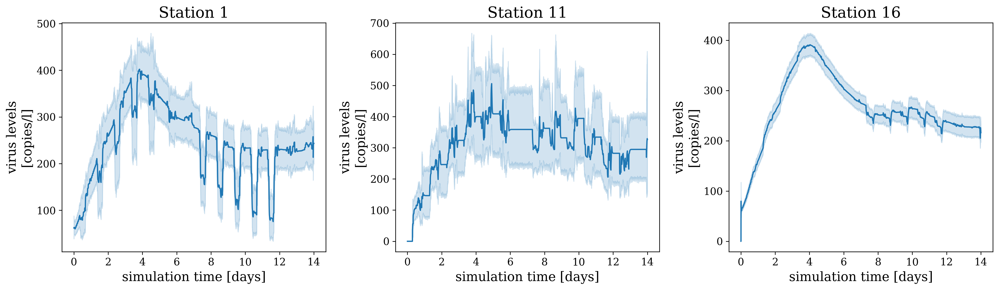

In [14]:
fig, axs = plt.subplots(ncols=3, sharey=False, figsize=(16.6, 5), dpi=300)
for i, (variate, variate_title) in enumerate(zip(["1", "11", "16"], ["Station 1", "Station 11", "Station 16"])):
    sns.lineplot(data=df_res.loc[df_res.sampling_point==variate,:], x="time_in_days", y="COVID_copies/l", ax=axs[i])
    axs[i].set_title(f"{variate_title}")    
    axs[i].set_xlabel(f"simulation time [days]") # , fontsize=15
    axs[i].set_ylabel("virus levels\n[copies/l]")
    axs[i].tick_params(axis='x')
    axs[i].tick_params(axis='y')
    axs[i].set_xticks(np.arange(0, 15, 2))

fig.tight_layout()
fig.savefig(os.path.join(plot_path, "concentrations", "COVID", f"up_mid_down_{file_name}"))

### Visualize all stations

0 0 0 1
1 0 1 2
2 0 2 3
3 0 3 4
4 1 0 5
5 1 1 6
6 1 2 7
7 1 3 8
8 2 0 9
9 2 1 10
10 2 2 11
11 2 3 12
12 3 0 13
13 3 1 14
14 3 2 15
15 3 3 16


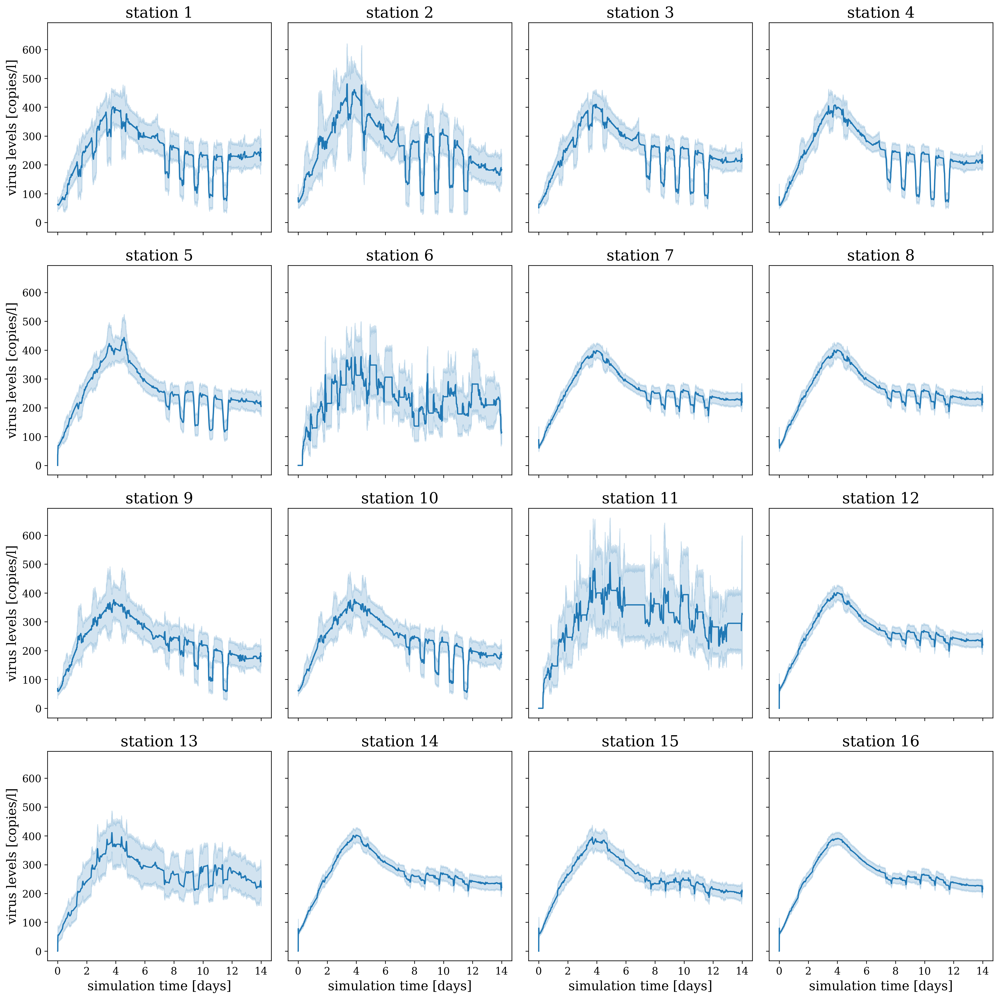

In [7]:
stations = [str(el) for el in range(1, 17)]

fig, axs = plt.subplots(ncols=4, nrows = 4, sharex = True, sharey=True, figsize=(16.6, 16.6), dpi=300)
j = 0
for i, (variate, variate_title) in enumerate(zip(stations, [f"station {el}" for el in stations])):
    col = i - j*4
    print(i, j, col, variate)
    sns.lineplot(data=df_res.loc[df_res.sampling_point==variate,:], x="time_in_days", y="COVID_copies/l", ax=axs[j, col])
    axs[j, col].set_title(f"{variate_title}")    
    if j == 3:
        axs[j, col].set_xlabel(f"simulation time [days]") # , fontsize=15
    else:
        axs[j, col].set_xlabel("")
    if col==0:
        axs[j, col].set_ylabel("virus levels [copies/l]")
    else:
        axs[j, col].set_ylabel("")
    axs[j, col].tick_params(axis='x')
    axs[j, col].tick_params(axis='y')
    if col==3:
        j += 1

axs[0,0].set_xticks(np.arange(0, 15, 2))

fig.tight_layout()
fig.savefig(os.path.join(plot_path, "concentrations", "COVID", f"all_stations_{file_name}"))

0 0 0 1
1 0 1 2
2 0 2 3
3 0 3 4
4 1 0 5
5 1 1 6
6 1 2 7
7 1 3 8
8 2 0 9
9 2 1 10
10 2 2 11
11 2 3 12
12 3 0 13
13 3 1 14
14 3 2 15
15 3 3 16


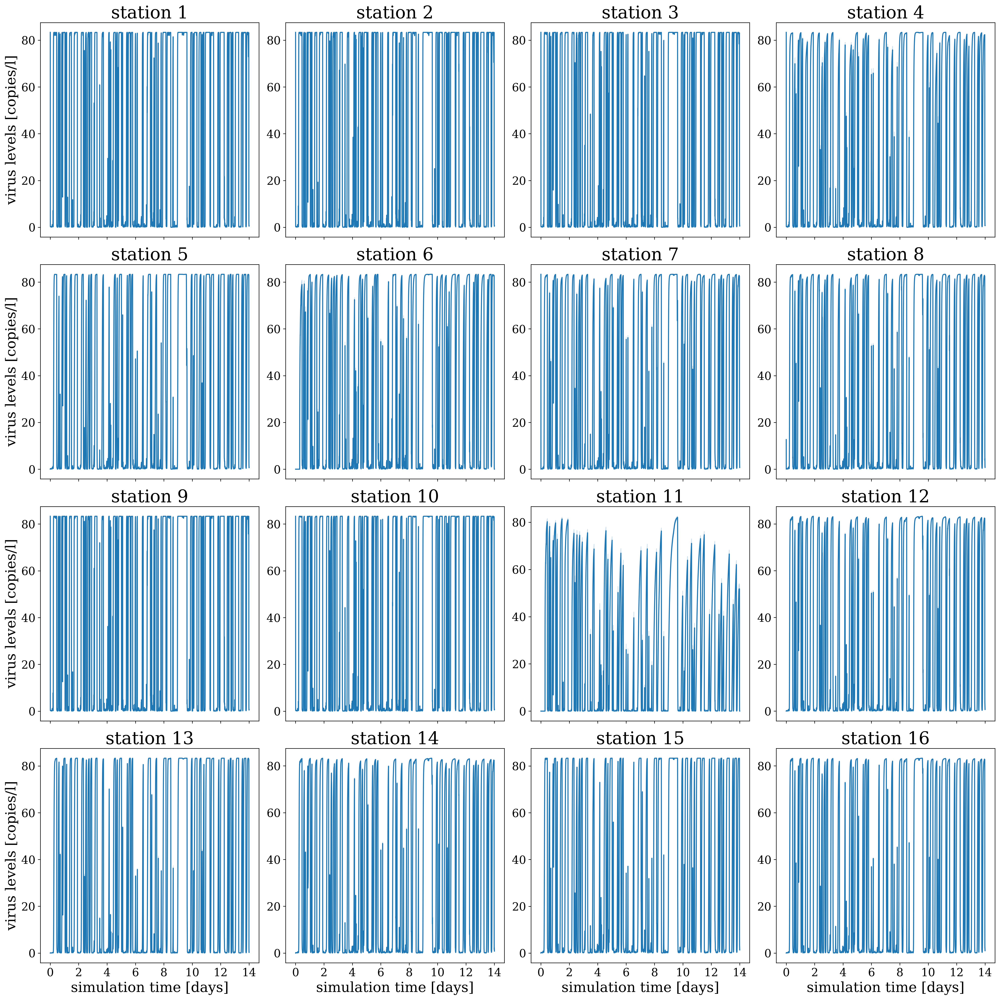

In [20]:
stations = [str(el) for el in range(1, 17)]

fig, axs = plt.subplots(ncols=4, nrows = 4, sharex = True, sharey=False, figsize=(16.6, 16.6), dpi=300)
j = 0
for i, (variate, variate_title) in enumerate(zip(stations, [f"station {el}" for el in stations])):
    col = i - j*4
    print(i, j, col, variate)
    sns.lineplot(data=df_res.loc[df_res.sampling_point==variate,:], x="time_in_days", y="PMMoV_copies/l", ax=axs[j, col])
    axs[j, col].set_title(f"{variate_title}")    
    if j == 3:
        axs[j, col].set_xlabel(f"simulation time [days]") # , fontsize=15
    else:
        axs[j, col].set_xlabel("")
    if col==0:
        axs[j, col].set_ylabel("virus levels [copies/l]")
    else:
        axs[j, col].set_ylabel("")
    axs[j, col].tick_params(axis='x')
    axs[j, col].tick_params(axis='y')
    if col==3:
        j += 1
    
axs[0,0].set_xticks(np.arange(0, 15, 2))    

fig.tight_layout()
fig.savefig(os.path.join(plot_path, "concentrations", "PMMoV", f"all_stations_{file_name}"))

## Flow Rate Plots

In [21]:
df_res = load_systems_data(experiment_series, resolution, rain_scenario, degradation_setting, file_type="flow_rates")

0 0 0 1
1 0 1 2
2 0 2 3
3 0 3 4
4 1 0 5
5 1 1 6
6 1 2 7
7 1 3 8
8 2 0 9
9 2 1 10
10 2 2 11
11 2 3 12
12 3 0 13
13 3 1 14
14 3 2 15
15 3 3 16


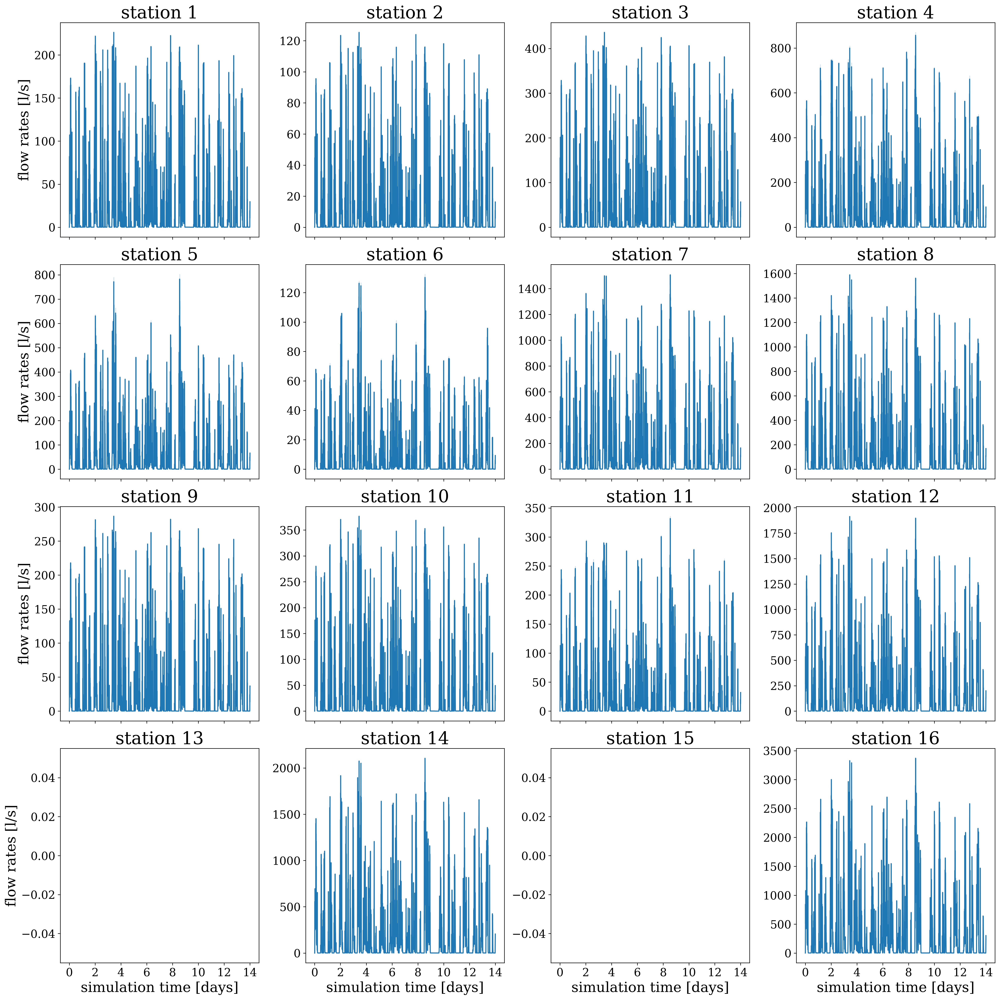

In [22]:
stations = [str(el) for el in range(1, 17)]

fig, axs = plt.subplots(ncols=4, nrows = 4, sharex = True, sharey=False, figsize=(16.6, 16.6), dpi=300)
j = 0
for i, (variate, variate_title) in enumerate(zip(stations, [f"station {el}" for el in stations])):
    col = i - j*4
    print(i, j, col, variate)
    sns.lineplot(data=df_res.loc[df_res.sampling_point==variate,:], x="time_in_days", y="l/s", ax=axs[j, col])
    axs[j, col].set_title(f"{variate_title}")    
    if j == 3:
        axs[j, col].set_xlabel(f"simulation time [days]", fontsize=20) # , fontsize=15
    else:
        axs[j, col].set_xlabel("")
    if col==0:
        axs[j, col].set_ylabel("flow rates [l/s]", fontsize=20)
    else:
        axs[j, col].set_ylabel("")
    axs[j, col].tick_params(axis='x')
    axs[j, col].tick_params(axis='y')
    if col==3:
        j += 1
    
axs[0,0].set_xticks(np.arange(0, 15, 2))    

fig.tight_layout()
fig.savefig(os.path.join(plot_path, "flow_rates", f"all_stations_{file_name}"))